In [1]:
import os

subj = "Subj2"

match subj:
    case 'Subj1':
        N_STAGES = 9
        DEFAULT_QSDA_THRESHOLD = 0.4
    case 'Subj2':
        N_STAGES = 8
        DEFAULT_QSDA_THRESHOLD = 0.28
    case 'Subj3':
        N_STAGES = 10
        DEFAULT_QSDA_THRESHOLD = 0.32

DEFAULT_UNIQUE_VALUES_THRESHOLD = 200
subj = f"E:/CourseProject/{subj}"

exp = "exp_hyperparameters"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

In [2]:
import mne
import tqdm
import numpy
import pandas
import sklearn.preprocessing
import sklearn.decomposition
import matplotlib.pyplot as plt

import SDA.analytics

In [3]:
def read_traditional():
    df_ft_psd_loc_db = pandas.read_feather(f'{subj}/src/df_ft_psd_loc_db.feather')
    df_ft_psd_ind_loc_log = pandas.read_feather(f'{subj}/src/df_ft_psd_ind_loc_log.feather')
    df_ft_coh_ind_loc = pandas.read_feather(f'{subj}/src/df_ft_coh_ind_loc.feather')
    df_ft_plv_ind_loc = pandas.read_feather(f'{subj}/src/df_ft_plv_ind_loc.feather')

    result =  pandas.concat([
        df_ft_psd_loc_db,
        df_ft_psd_ind_loc_log,
        df_ft_coh_ind_loc,
        df_ft_plv_ind_loc
    ], axis = 1)

    if subj == "E:/CourseProject/Subj2":
        result = result[:-2]
    return result

epochs = mne.read_epochs(f"{subj}/src/epochs_filt_rr-epo.fif").drop_channels(ch_names = [ "A1", "A2" ])
if subj == "E:/CourseProject/Subj2": # m8 (artifacts at the end)
    epochs = epochs[:-2]
data = epochs.get_data(copy = True)

original_traditional = read_traditional()

Reading E:\CourseProject\Subj2\src\epochs_filt_rr-epo.fif ...
    Found the data of interest:
        t =    -500.00 ...     500.00 ms
        0 CTF compensation matrices available
Not setting metadata
2019 matching events found
No baseline correction applied
0 projection items activated


In [4]:
def run_sda(all_features: pandas.DataFrame, n_components: int, folder: str):
    if os.path.exists(f"{folder}/stats.svg"):
        return
    os.makedirs(folder, exist_ok = True)

    # Scale features
    all_features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
    # numpy.save(f"{folder}/all_features.npy", all_features)
    # numpy.savetxt(f"{folder}/all_features_shape.txt", all_features.shape)

    # PCA
    pca = sklearn.decomposition.PCA(n_components = n_components, svd_solver = "full", random_state = 42)
    pca_features = pca.fit_transform(all_features)
    numpy.save(f"{folder}/pca_features.npy", pca_features)
    numpy.savetxt(f"{folder}/pca_features_shape.txt", pca_features.shape)
    
    numpy.savetxt(f"{folder}/explained_variance.txt", [ pca.explained_variance_ratio_.sum() ])
    numpy.savetxt(f"{folder}/explained_variance_ratios.txt", pca.explained_variance_ratio_)

    # SDA
    sda = SDA.SDA(n_jobs = -1, scale = False, verbose = False)
    results, df_st_edges = sda.apply(pca_features)
    
    results.to_csv(f"{folder}/results.csv")
    df_st_edges.to_csv(f"{folder}/df_st_edges.csv")

    # Analyze
    best_results = SDA.analytics.best_results(results, key = 'Avg-Silh')
    best_results.to_csv(f"{folder}/best_results.csv")
    
    best_result = SDA.analytics.best_result(results, key = 'Avg-Silh', n_stages = N_STAGES)
    best_result_df = pandas.DataFrame([ best_result ])
    best_result_df.to_csv(f"{folder}/best_result.csv")
    
    best_edges = numpy.array(best_result['St_edges'])
    numpy.savetxt(f"{folder}/best_edges.txt", best_edges, fmt = "%d", newline = ' ')

    stage_timing = SDA.analytics.stage_timing(best_edges, epochs)
    stage_timing.to_csv(f"{folder}/stage_timing.csv")
    
    SDA.analytics.plot_stats(pca_features, epochs, best_result, df_st_edges).savefig(f"{folder}/stats.svg")


def read_silh_one(folder: str):
    return pandas.read_csv(f"{folder}/best_result.csv")["Avg-Silh"].iloc[0]

### PCA

In [5]:
exp = "exp_hyperparameters/pca"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

N_COMPONENTS = [3, 5, 7, 10, 15, 20, 30, 50, 75, 100, 200, 300, 400, 500, 600, 700]

In [6]:
original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
original_qsda = pandas.read_feather(f"{subj}/exp_full_flow/qsda/best_features.feather")
original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

noise_qsda = numpy.load(f"{subj}/exp_noise/qsda/best_features.npy")
if subj == "E:/CourseProject/Subj2":
    noise_qsda = noise_qsda[:-2]

shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
shuffle_order = shuffle_order[shuffle_order < len(epochs)]
shuffled_traditional = original_traditional.to_numpy()[shuffle_order]
shuffled_qsda = numpy.load(f"{subj}/exp_shuffled/qsda/best_features.npy")
if subj == "E:/CourseProject/Subj2":
    shuffled_qsda = shuffled_qsda[:-2]
shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

In [7]:
def analyze(all_features: pandas.DataFrame, n_components: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{n_components}"
    run_sda(all_features, n_components, folder)

for n_components in tqdm.tqdm(N_COMPONENTS):
    analyze(original_traditional, n_components, "original_traditional")
    analyze(original_topological, n_components, "original_topological")
    analyze(original_qsda, n_components, "original_qsda")
    analyze(original_combined, n_components, "original_combined")
    analyze(noise_qsda, n_components, "noise_qsda")
    analyze(shuffled_traditional, n_components, "shuffled_traditional")
    analyze(shuffled_qsda, n_components, "shuffled_qsda")
    analyze(shuffled_combined, n_components, "shuffled_combined")

100%|██████████| 16/16 [00:00<?, ?it/s]


### QSDA min_unique_values

In [8]:
exp = "exp_hyperparameters/qsda_min_unique_values"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_MIN_UNIQUE_VALUES = [0, 50, 100, 200, 300, 500, 750, 1000]

  0%|          | 0/8 [00:00<?, ?it/s]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 2103) 0
(2017, 765) 0
(2017, 2868) 0


 12%|█▎        | 1/8 [05:10<36:12, 310.41s/it]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 1808) 0
(2017, 765) 0
(2017, 2573) 0


 25%|██▌       | 2/8 [11:58<36:48, 368.16s/it]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 1788) 0
(2017, 765) 0
(2017, 2553) 0


 38%|███▊      | 3/8 [18:18<31:05, 373.19s/it]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 1650) 0
(2017, 765) 0
(2017, 2415) 0


 50%|█████     | 4/8 [24:36<25:01, 375.40s/it]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 1647) 0
(2017, 765) 0
(2017, 2412) 0


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))
 62%|██████▎   | 5/8 [30:46<18:39, 373.13s/it]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 1518) 0
(2017, 765) 0
(2017, 2283) 0


 75%|███████▌  | 6/8 [36:41<12:14, 367.16s/it]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 1410) 0
(2017, 765) 0
(2017, 2175) 0


 88%|████████▊ | 7/8 [42:28<06:00, 360.43s/it]

Using threshold 0.28
Using threshold 0.28
Using threshold 0.28
(2017, 1409) 0
(2017, 765) 0
(2017, 2174) 0


100%|██████████| 8/8 [48:05<00:00, 360.65s/it]


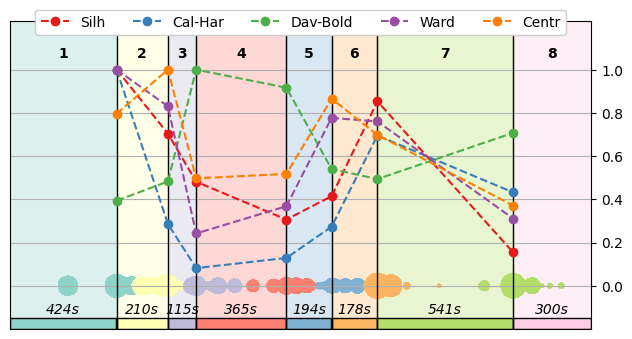

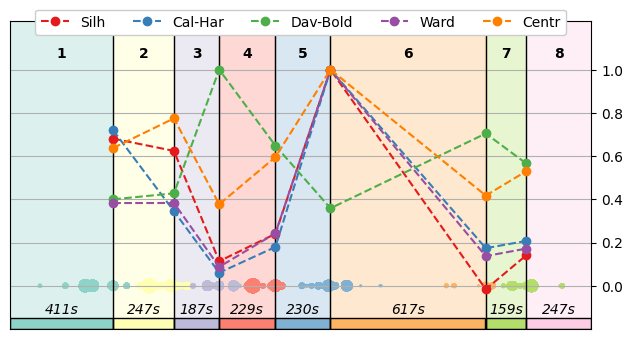

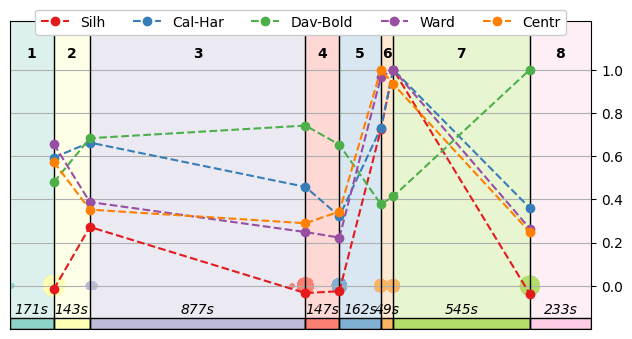

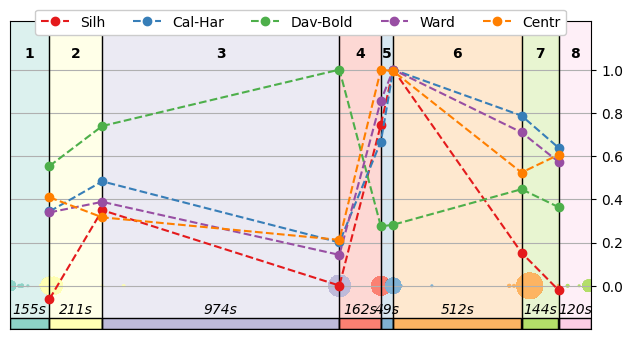

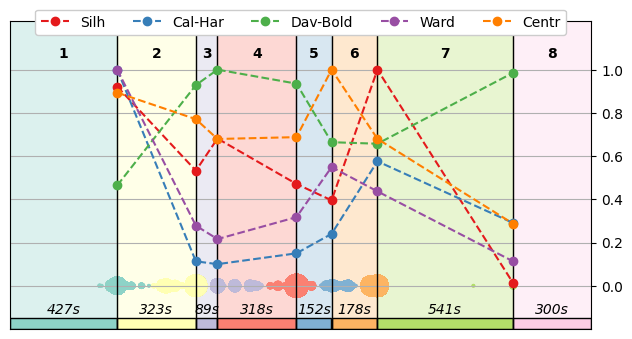

...

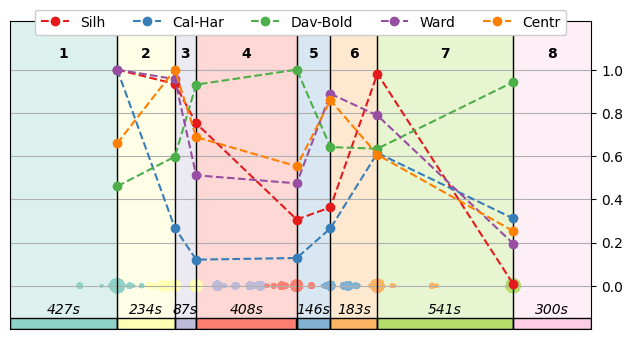

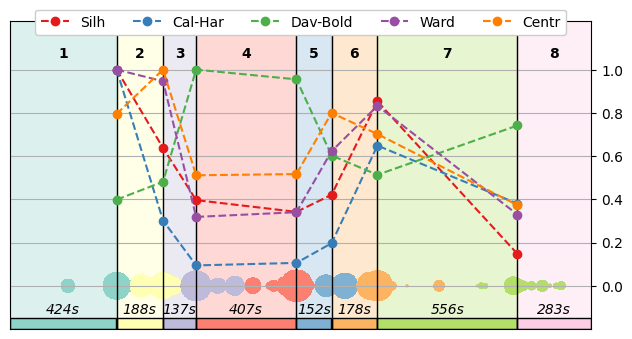

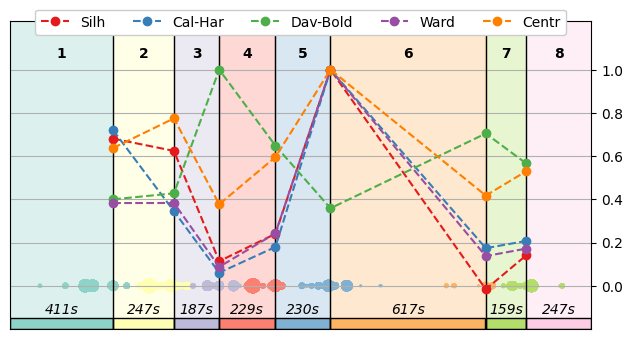

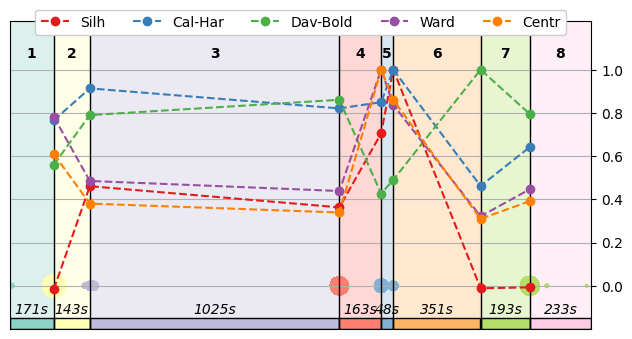

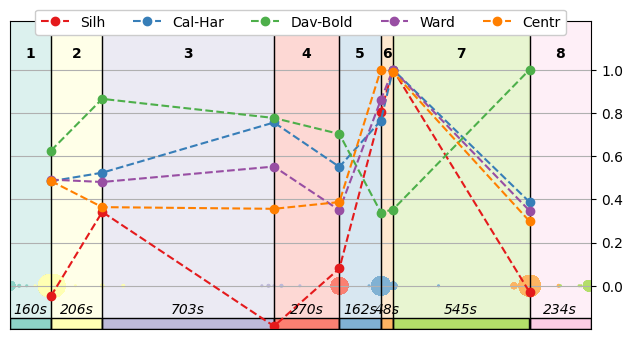

In [9]:
def process_qsda(features: pandas.DataFrame, folder: str, min_unique_values: int):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = -1,
        scores_folder = folder,

        threshold = DEFAULT_QSDA_THRESHOLD,
        min_unique_values = min_unique_values
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, min_unique_values: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{min_unique_values}"
    run_sda(all_features, 15, folder)

for min_unique_values in tqdm.tqdm(TRY_MIN_UNIQUE_VALUES):
    original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda", min_unique_values)
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = pandas.read_feather(f"{subj}/exp_noise/features/features.feather")
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda", min_unique_values)
    if subj == "E:/CourseProject/Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda", min_unique_values)
    if subj == "E:/CourseProject/Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, min_unique_values, "original_traditional")
    # analyze(original_topological, min_unique_values, "original_topological")
    analyze(original_qsda, min_unique_values, "original_qsda")
    analyze(original_combined, min_unique_values, "original_combined")
    analyze(noise_qsda, min_unique_values, "noise_qsda")
    # analyze(shuffled_traditional, min_unique_values, "shuffled_traditional")
    analyze(shuffled_qsda, min_unique_values, "shuffled_qsda")
    analyze(shuffled_combined, min_unique_values, "shuffled_combined")

### QSDA threshold

In [10]:
exp = "exp_hyperparameters/qsda_threshold"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_THRESHOLDS = [100, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2500, 3000, 4000]

  0%|          | 0/12 [00:00<?, ?it/s]

Using threshold 0.5709678045817106
Using threshold 0.5156046399838534
Using threshold 0.5940062602646157


  8%|▊         | 1/12 [05:51<1:04:25, 351.41s/it]

Using threshold 0.509733420365908
Using threshold 0.4077967275905382
Using threshold 0.4866207775758082


 17%|█▋        | 2/12 [11:32<57:31, 345.14s/it]  

Using threshold 0.4571673009036781
Using threshold 0.3331639751306373
Using threshold 0.3949942153024613


 25%|██▌       | 3/12 [17:11<51:21, 342.43s/it]

Using threshold 0.4021279764066839
Using threshold 0.2853018312705077
Using threshold 0.3344822467450577


 33%|███▎      | 4/12 [22:57<45:49, 343.73s/it]

Using threshold 0.3615179055065675
Using threshold 0.2487854638579178
Using threshold 0.2831208518079454


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))
 42%|████▏     | 5/12 [29:10<41:20, 354.31s/it]

Using threshold 0.3286324230181414
Using threshold 0.2223006214954095
Using threshold 0.2530100338510307


 50%|█████     | 6/12 [35:13<35:43, 357.22s/it]

Using threshold 0.2958947902691709
Using threshold 0.200072662918152
Using threshold 0.2326266029866076


 58%|█████▊    | 7/12 [40:59<29:29, 353.80s/it]

Using threshold 0.2722619314780305
Using threshold 0.1787713956277908
Using threshold 0.2151291502803497


 67%|██████▋   | 8/12 [46:41<23:19, 349.95s/it]

Using threshold 0.2476242368294785
Using threshold 0.163549325687586
Using threshold 0.1971042697641704


 75%|███████▌  | 9/12 [52:30<17:29, 349.69s/it]

Using threshold 0.2137213206235408
Using threshold 0.139417544783297
Using threshold 0.1712231163863237


 83%|████████▎ | 10/12 [58:17<11:37, 348.80s/it]

Using threshold 0.1901780438077822
Using threshold 0.1129949340066536
Using threshold 0.1465668405601868


 92%|█████████▏| 11/12 [1:03:58<05:46, 346.57s/it]

Using threshold 0.1527845246262669
Using threshold 0.0696070463256303
Using threshold 0.1144956442769009


100%|██████████| 12/12 [1:09:43<00:00, 348.66s/it]


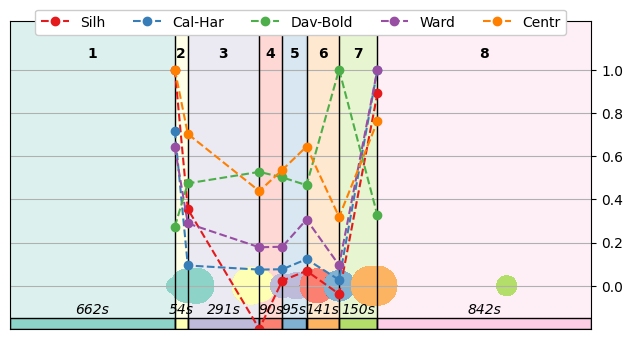

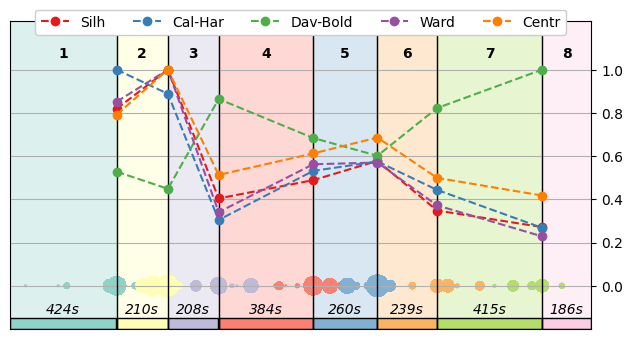

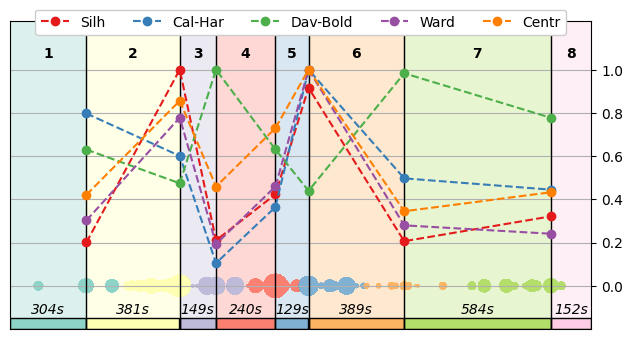

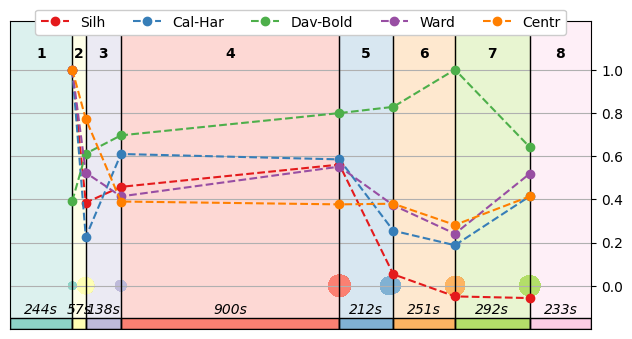

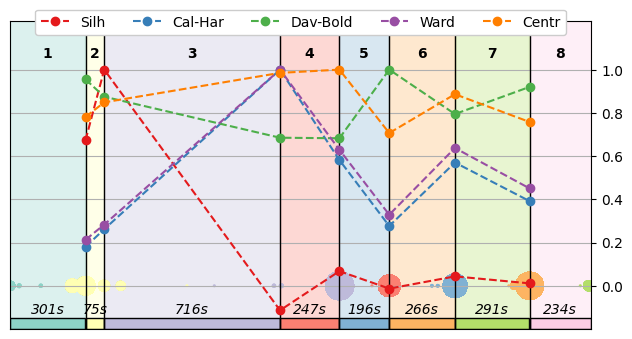

...

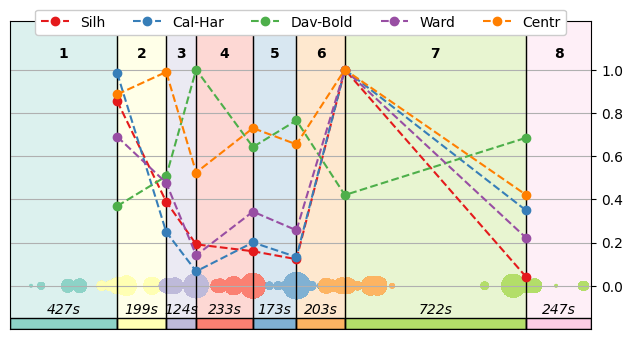

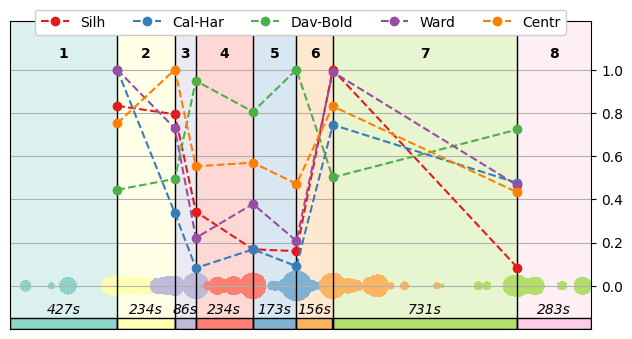

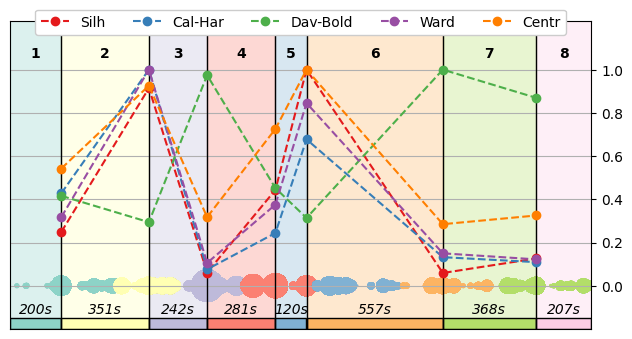

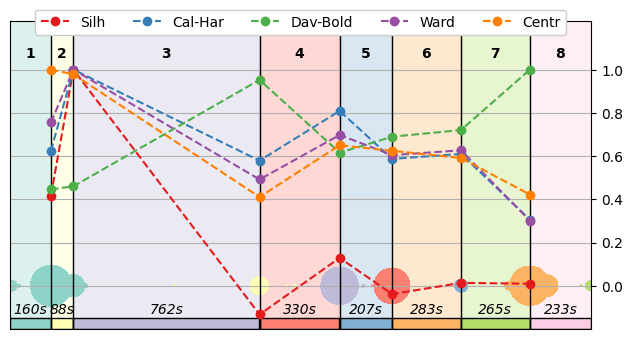

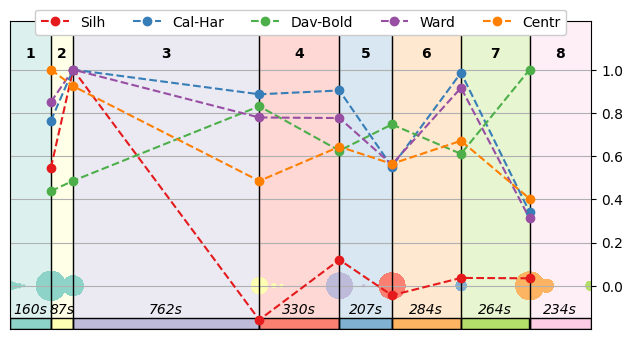

In [11]:
def process_qsda(features: pandas.DataFrame, folder: str, threshold: int):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = -1,
        scores_folder = folder,

        threshold = threshold,
        min_unique_values = DEFAULT_UNIQUE_VALUES_THRESHOLD
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, threshold: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{threshold}"
    run_sda(all_features, 15, folder)

for threshold in tqdm.tqdm(TRY_THRESHOLDS):
    original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda", threshold)
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = pandas.read_feather(f"{subj}/exp_noise/features/features.feather")
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda", threshold)
    if subj == "E:/CourseProject/Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda", threshold)
    if subj == "E:/CourseProject/Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, threshold, "original_traditional")
    # analyze(original_topological, threshold, "original_topological")
    analyze(original_qsda, threshold, "original_qsda")
    analyze(original_combined, threshold, "original_combined")
    analyze(noise_qsda, threshold, "noise_qsda")
    # analyze(shuffled_traditional, threshold, "shuffled_traditional")
    analyze(shuffled_qsda, threshold, "shuffled_qsda")
    analyze(shuffled_combined, threshold, "shuffled_combined")

### Filtering

In [12]:
exp = "exp_hyperparameters/filtering"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_THRESHOLDS = [5, 10, 15, 20, 25, 35, 40, 45, 50]

TRYING: 5
Filtered diagrams: (76646, 205, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:21<00:00, 3562.13it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:21<00:00, 3571.09it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:21<00:00, 3619.07it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:56<00:00,  4.38s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [00:58<00:00, 1315.00it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 72, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:30<00:00, 1587.29it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:31<00:00, 1553.63it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:34<00:00, 1404.65it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:13<00:00, 660.04it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 526, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:00<00:00, 2076.12it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:00<00:00, 2118.09it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2141.20it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:04<00:00,  3.21it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:02<00:00, 930.93it/s] 


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 197, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:11<00:00, 6910.40it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:10<00:00, 7479.29it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:53<00:00,  4.14s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:21<00:00, 3731.70it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 659, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 3307.62it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 3764.23it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:04<00:00,  3.00it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 3058.21it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 206, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:22<00:00, 3548.08it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:22<00:00, 3590.62it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:23<00:00, 3398.42it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [01:01<00:00,  4.72s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:03<00:00, 1275.05it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 74, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:33<00:00, 1461.16it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:33<00:00, 1459.11it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:33<00:00, 1464.73it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:20<00:00, 598.34it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 521, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:01<00:00, 1893.42it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:01<00:00, 1935.04it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:01<00:00, 1956.89it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.37it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 917.85it/s] 


Features: (2019, 291)
Using threshold 0.28
TRYING: 10
Filtered diagrams: (76646, 202, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:24<00:00, 3129.23it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:25<00:00, 3014.80it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:22<00:00, 3401.50it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:54<00:00,  4.21s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [00:59<00:00, 1290.36it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 70, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:30<00:00, 1598.82it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:30<00:00, 1575.90it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:40<00:00, 1201.78it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:22<00:00, 586.50it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 491, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:01<00:00, 1828.53it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:01<00:00, 1998.74it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2026.90it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.26it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:02<00:00, 694.13it/s]


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 192, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:14<00:00, 5540.62it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:13<00:00, 6185.74it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:55<00:00,  4.26s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:23<00:00, 3455.11it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 620, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 3090.10it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 2847.74it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:04<00:00,  3.00it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 2671.86it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 202, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:27<00:00, 2898.92it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:24<00:00, 3265.91it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:24<00:00, 3307.70it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [01:04<00:00,  4.94s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:11<00:00, 1123.90it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 73, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:40<00:00, 1202.93it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:38<00:00, 1244.75it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:37<00:00, 1300.28it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:28<00:00, 546.69it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 484, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:01<00:00, 1867.03it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:01<00:00, 1869.54it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:01<00:00, 1786.72it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.55it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 843.29it/s]


Features: (2019, 291)
Using threshold 0.28
TRYING: 15
Filtered diagrams: (76646, 198, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:22<00:00, 3446.66it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:22<00:00, 3347.43it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:21<00:00, 3521.87it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [01:01<00:00,  4.72s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [01:19<00:00, 966.98it/s] 


Features: (2017, 7980)
Filtered diagrams: (48408, 65, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:32<00:00, 1509.78it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:32<00:00, 1503.17it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:32<00:00, 1495.54it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:12<00:00,  1.01it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:09<00:00, 693.05it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 459, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:00<00:00, 2331.49it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:00<00:00, 2339.82it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2371.18it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  4.33it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:01<00:00, 1038.90it/s]


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 184, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:09<00:00, 8621.51it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:08<00:00, 9154.39it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:47<00:00,  3.63s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:17<00:00, 4490.77it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 585, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 3358.30it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 3545.38it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.71it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 2709.05it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 199, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:22<00:00, 3627.78it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:22<00:00, 3640.97it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:23<00:00, 3392.39it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:59<00:00,  4.55s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:01<00:00, 1316.50it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 68, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:31<00:00, 1543.97it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:31<00:00, 1528.90it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:30<00:00, 1569.32it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:13<00:00,  1.06s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:11<00:00, 675.43it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 447, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:00<00:00, 2330.17it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 2191.01it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 2313.23it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  4.26it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 968.09it/s] 


Features: (2019, 291)
Using threshold 0.28
TRYING: 20
Filtered diagrams: (76646, 194, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:21<00:00, 3550.80it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:22<00:00, 3470.42it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:22<00:00, 3479.36it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:54<00:00,  4.17s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [01:02<00:00, 1222.63it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 64, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:32<00:00, 1477.81it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:34<00:00, 1413.36it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:31<00:00, 1525.34it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:13<00:00,  1.00s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:13<00:00, 658.30it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 423, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:00<00:00, 2139.27it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:00<00:00, 2246.71it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2106.91it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  4.63it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:02<00:00, 1003.49it/s]


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 182, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:08<00:00, 9454.99it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:08<00:00, 9067.48it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:47<00:00,  3.67s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:18<00:00, 4381.90it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 540, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 4126.21it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 4058.97it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.95it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 3226.29it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 194, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:23<00:00, 3395.68it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:23<00:00, 3380.28it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:23<00:00, 3455.81it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:55<00:00,  4.24s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:02<00:00, 1297.94it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 62, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:30<00:00, 1576.22it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:30<00:00, 1579.56it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:31<00:00, 1522.44it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:12<00:00,  1.02it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:10<00:00, 684.28it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 415, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:00<00:00, 2385.14it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 2206.56it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:01<00:00, 1609.39it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  4.62it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 957.72it/s] 


Features: (2019, 291)
Using threshold 0.28


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))


TRYING: 25
Filtered diagrams: (76646, 189, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:22<00:00, 3380.59it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:23<00:00, 3318.65it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:24<00:00, 3099.47it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:51<00:00,  3.96s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [00:58<00:00, 1310.33it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 60, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:31<00:00, 1513.78it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:31<00:00, 1516.02it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:31<00:00, 1542.66it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:11<00:00,  1.09it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:10<00:00, 683.81it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 388, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:00<00:00, 2316.91it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:00<00:00, 2398.17it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2362.02it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.27it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:01<00:00, 1047.05it/s]


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 176, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:09<00:00, 8745.36it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:08<00:00, 9317.01it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:46<00:00,  3.57s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:19<00:00, 4048.78it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 501, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 5096.91it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 4015.09it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  4.05it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 3304.39it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 189, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:23<00:00, 3398.53it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:22<00:00, 3586.97it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:23<00:00, 3464.07it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:54<00:00,  4.17s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:04<00:00, 1261.01it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 59, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:32<00:00, 1470.64it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:31<00:00, 1542.67it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:31<00:00, 1545.50it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:11<00:00,  1.09it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:11<00:00, 681.00it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 391, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:00<00:00, 2115.03it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 2363.88it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:01<00:00, 2012.30it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  4.93it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 975.61it/s] 


Features: (2019, 291)
Using threshold 0.28
TRYING: 35
Filtered diagrams: (76646, 187, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:22<00:00, 3427.54it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:21<00:00, 3610.53it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:22<00:00, 3478.62it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:54<00:00,  4.21s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [00:57<00:00, 1337.73it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 53, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:30<00:00, 1603.03it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:30<00:00, 1595.11it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:33<00:00, 1456.66it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:11<00:00,  1.15it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:10<00:00, 690.02it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 327, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:00<00:00, 2390.53it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:00<00:00, 2414.26it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2398.49it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  6.09it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:02<00:00, 983.61it/s] 


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 166, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:09<00:00, 8905.13it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:08<00:00, 9258.43it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:42<00:00,  3.29s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:18<00:00, 4409.11it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 420, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 4195.89it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 3948.66it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.09it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 3404.55it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 187, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:22<00:00, 3606.32it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:23<00:00, 3417.60it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:22<00:00, 3545.06it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:54<00:00,  4.16s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:01<00:00, 1321.35it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 53, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:31<00:00, 1557.42it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:31<00:00, 1545.49it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:32<00:00, 1476.97it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:10<00:00,  1.20it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:14<00:00, 647.16it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 330, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:00<00:00, 2153.76it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 2270.51it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 2246.44it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.97it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:01<00:00, 1045.02it/s]


Features: (2019, 291)
Using threshold 0.28
TRYING: 40
Filtered diagrams: (76646, 184, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:22<00:00, 3345.65it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:21<00:00, 3518.97it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:22<00:00, 3481.42it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:49<00:00,  3.84s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [00:57<00:00, 1321.79it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 51, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:30<00:00, 1583.74it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:29<00:00, 1616.92it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:30<00:00, 1604.08it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:09<00:00,  1.44it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:09<00:00, 697.02it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 301, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:00<00:00, 2336.24it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:00<00:00, 2407.29it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2388.56it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  6.61it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:02<00:00, 944.29it/s] 


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 159, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:09<00:00, 8946.17it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:08<00:00, 9451.98it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:41<00:00,  3.19s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:21<00:00, 3816.62it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 382, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 4100.45it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 4012.65it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.43it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 2958.49it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 183, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:22<00:00, 3618.53it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:21<00:00, 3700.68it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:23<00:00, 3506.63it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:52<00:00,  4.05s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:02<00:00, 1285.72it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 50, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:33<00:00, 1467.46it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:32<00:00, 1479.34it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:32<00:00, 1480.11it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:10<00:00,  1.25it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:13<00:00, 658.72it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 310, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:00<00:00, 2353.24it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 2277.43it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 2186.36it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  6.06it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 875.64it/s] 


Features: (2019, 291)
Using threshold 0.28
TRYING: 45
Filtered diagrams: (76646, 182, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:22<00:00, 3435.45it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:21<00:00, 3573.70it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:21<00:00, 3484.44it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:50<00:00,  3.88s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [00:58<00:00, 1304.63it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 46, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:31<00:00, 1516.01it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:31<00:00, 1532.11it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:32<00:00, 1501.72it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.58it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:11<00:00, 679.08it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 281, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:00<00:00, 2308.46it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:00<00:00, 2252.43it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:00<00:00, 2305.99it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.09it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:01<00:00, 1019.69it/s]


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 154, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:08<00:00, 9157.25it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:08<00:00, 8997.70it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:40<00:00,  3.15s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:19<00:00, 4232.97it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 351, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 5098.11it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 5330.06it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  6.04it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 3687.57it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 182, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:23<00:00, 3509.78it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:23<00:00, 3498.23it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:22<00:00, 3522.08it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:53<00:00,  4.08s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:01<00:00, 1303.85it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 48, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:31<00:00, 1543.15it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:31<00:00, 1556.88it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:31<00:00, 1528.68it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:10<00:00,  1.27it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:11<00:00, 674.40it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 281, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:00<00:00, 2289.43it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 2238.23it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 2327.17it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.09it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 1006.45it/s]


Features: (2019, 291)
Using threshold 0.28
TRYING: 50
Filtered diagrams: (76646, 178, 3)
Calculating Betti features


 betti: 100%|██████████| 76646/76646 [00:22<00:00, 3454.06it/s]


Calculating landscape features


 landscape: 100%|██████████| 76646/76646 [00:21<00:00, 3558.17it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 76646/76646 [00:21<00:00, 3514.16it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:49<00:00,  3.79s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 76646/76646 [00:59<00:00, 1294.79it/s]


Features: (2017, 7980)
Filtered diagrams: (48408, 44, 3)
Calculating Betti features


 betti: 100%|██████████| 48408/48408 [00:31<00:00, 1539.74it/s]


Calculating landscape features


 landscape: 100%|██████████| 48408/48408 [00:31<00:00, 1535.81it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48408/48408 [00:31<00:00, 1518.23it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48408/48408 [01:11<00:00, 677.68it/s]


Features: (2017, 10872)
Filtered diagrams: (2017, 254, 3)
Calculating Betti features


overall betti: 100%|██████████| 2017/2017 [00:01<00:00, 2007.61it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2017/2017 [00:01<00:00, 1973.55it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2017/2017 [00:01<00:00, 1745.55it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.64it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2017/2017 [00:02<00:00, 946.20it/s] 


Features: (2017, 291)
Using threshold 0.28
Filtered diagrams: (80760, 148, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:09<00:00, 8557.52it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:09<00:00, 8351.41it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:39<00:00,  3.03s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [00:18<00:00, 4353.83it/s]


Features: (2019, 4720)
Filtered diagrams: (2019, 317, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 5104.60it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 3774.15it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  6.64it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:00<00:00, 2850.65it/s]


Features: (2019, 160)
Using threshold 0.28
Filtered diagrams: (80760, 178, 3)
Calculating Betti features


 betti: 100%|██████████| 80760/80760 [00:23<00:00, 3455.30it/s]


Calculating landscape features


 landscape: 100%|██████████| 80760/80760 [00:22<00:00, 3529.55it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 80760/80760 [00:22<00:00, 3530.63it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:51<00:00,  3.98s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 80760/80760 [01:02<00:00, 1289.92it/s]


Features: (2126, 7980)
Filtered diagrams: (48456, 47, 3)
Calculating Betti features


 betti: 100%|██████████| 48456/48456 [00:31<00:00, 1542.42it/s]


Calculating landscape features


 landscape: 100%|██████████| 48456/48456 [00:31<00:00, 1534.95it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 48456/48456 [00:31<00:00, 1525.23it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:10<00:00,  1.29it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 48456/48456 [01:11<00:00, 675.95it/s]


Features: (2203, 9966)
Filtered diagrams: (2019, 247, 3)
Calculating Betti features


overall betti: 100%|██████████| 2019/2019 [00:00<00:00, 2267.67it/s]


Calculating landscape features


overall landscape: 100%|██████████| 2019/2019 [00:00<00:00, 2259.00it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 2019/2019 [00:00<00:00, 2309.57it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.99it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 2019/2019 [00:02<00:00, 1002.64it/s]


Features: (2019, 291)
Using threshold 0.28


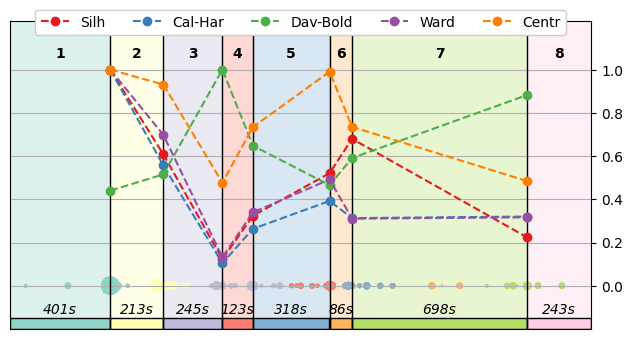

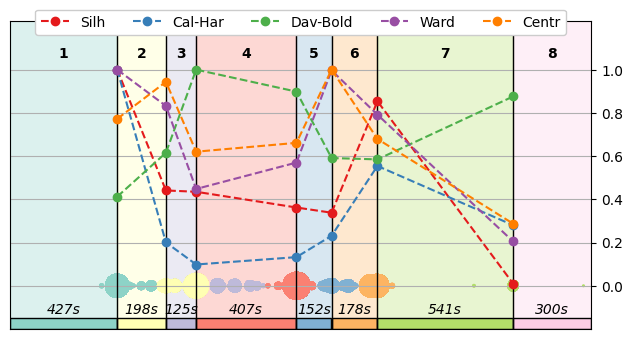

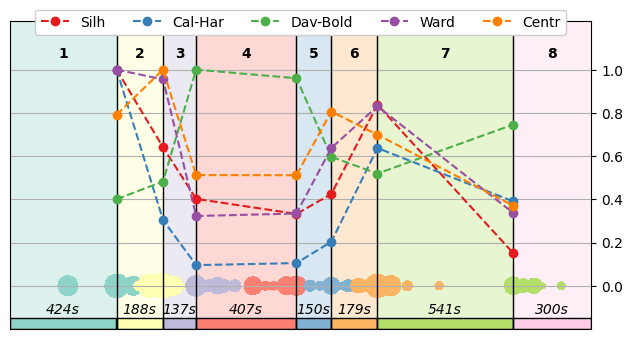

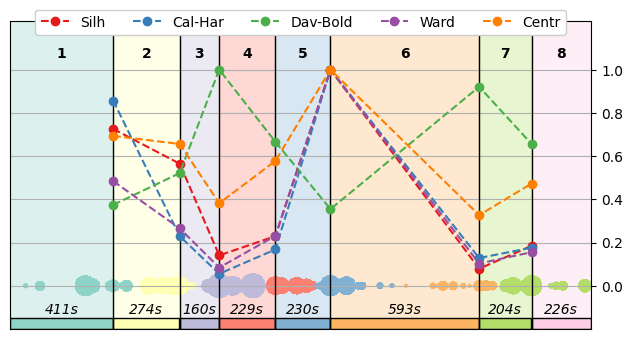

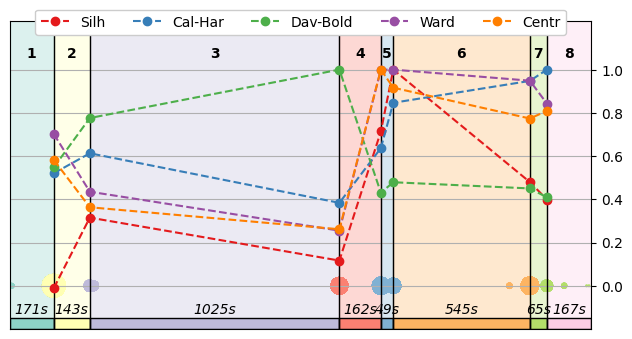

...

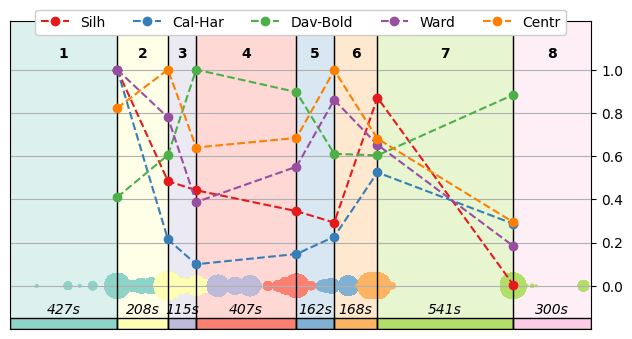

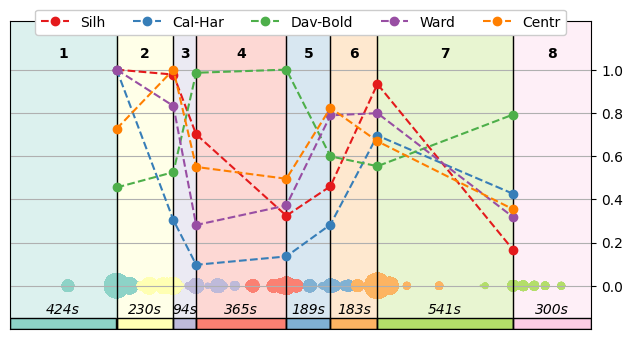

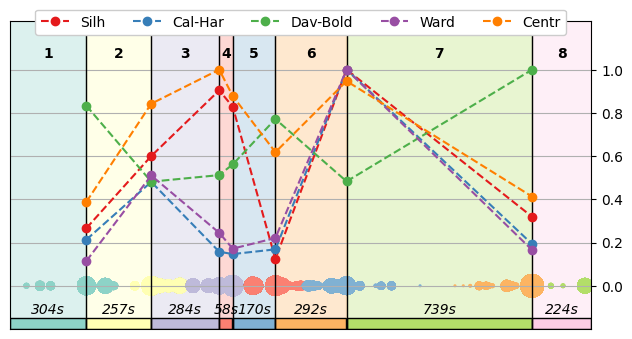

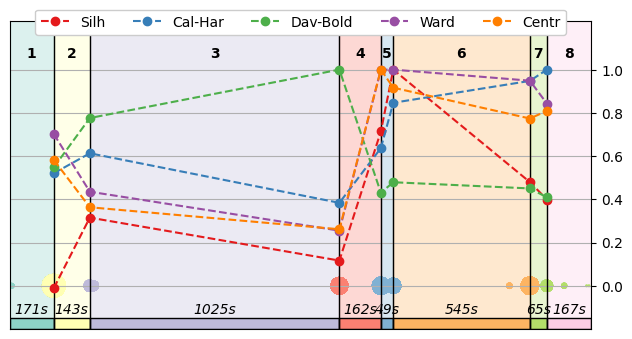

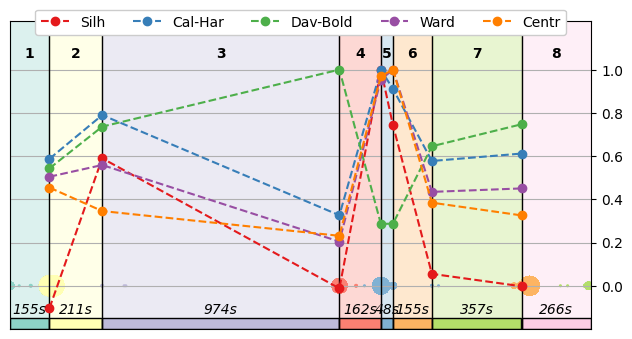

In [13]:
import SDA.topology
import sklearn.preprocessing

def make_features(src_exp: str, threshold: float, reduced: bool = False, n_channels: int = 38):
    folder = f"{subj}/{src_exp}/features"
    
    diagrams = numpy.load(f'{folder}/per_channel/diagrams.npy')
    per_channel_extractor = SDA.topology.PerChannelFeatureExtractor(n_jobs = -1, folder = None, reduced = reduced, filtering_percentile = threshold)
    per_channel_features = per_channel_extractor.calculate_features(n_channels, diagrams)

    if not reduced:
        diagrams = numpy.load(f'{folder}/dissimilarity/diagrams.npy')
        dissimilarity_extractor = SDA.topology.DissimilarityFeatureExtractor(n_jobs = -1, folder = None, reduced = reduced, filtering_percentile = threshold)
        dissimilarity_features = dissimilarity_extractor.calculate_features(len(per_channel_features), diagrams)

    diagrams = numpy.load(f'{folder}/overall/diagrams.npy')
    overall_extractor = SDA.topology.OverallFeatureExtractor(n_jobs = -1, folder = None, reduced = reduced, filtering_percentile = threshold)
    overall_features = overall_extractor.calculate_features(diagrams)

    if reduced:
        all_features = pandas.concat([per_channel_features, overall_features], axis = 1).fillna(0)
    else:
        all_features = pandas.concat([per_channel_features, dissimilarity_features, overall_features], axis = 1).fillna(0)
    
    features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
    return pandas.DataFrame(features, columns = all_features.columns)

def process_qsda(features: pandas.DataFrame, folder: str):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = -1,
        scores_folder = folder,

        threshold = DEFAULT_QSDA_THRESHOLD,
        min_unique_values = DEFAULT_UNIQUE_VALUES_THRESHOLD
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, threshold: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{threshold}"
    run_sda(all_features, 15, folder)

for threshold in TRY_THRESHOLDS:
    print(f"TRYING: {threshold}")

    original_topological = make_features("exp_full_flow", threshold)
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda")
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = make_features("exp_noise", threshold, reduced = True, n_channels = 40)
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda")
    if subj == "E:/CourseProject/Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = make_features("exp_shuffled", threshold)
    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda")
    if subj == "E:/CourseProject/Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, threshold, "original_traditional")
    analyze(original_topological, threshold, "original_topological")
    analyze(original_qsda, threshold, "original_qsda")
    analyze(original_combined, threshold, "original_combined")
    analyze(noise_qsda, threshold, "noise_qsda")
    # analyze(shuffled_traditional, threshold, "shuffled_traditional")
    analyze(shuffled_qsda, threshold, "shuffled_qsda")
    analyze(shuffled_combined, threshold, "shuffled_combined")